# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>


## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_4:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


# 1.1 Reading Data

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer


from sklearn.feature_extraction.text import CountVectorizer
from sklearn import metrics
from sklearn.metrics import roc_curve, auc, accuracy_score, confusion_matrix
from nltk.stem.porter import PorterStemmer
from sklearn.neighbors import KNeighborsClassifier
##from sklearn import cross_validation
from sklearn.metrics import roc_auc_score
##from sklearn.cross_validation import cross_val_score
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter
## os.chdir('C:/Users/kingsubham27091995/Desktop/AppliedAiCouse/DonorsChoose')
import time
from scipy.sparse import hstack

In [2]:
project_data = pd.read_csv('c:\\train_data.csv',nrows = 50000)
resource_data = pd.read_csv('c:\\resources.csv')

In [3]:
print("Number of points in train data", project_data.shape)
print('_ '*35)
print("The attribute Names",project_data.columns.values)
#project_data.head(20)

Number of points in train data (50000, 17)
_ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ 
The attribute Names ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
print("Number of points in resource data :", resource_data.shape)
print("attributes in resource data :", resource_data.columns.values)
resource_data.head(2)

Number of points in resource data : (1541272, 4)
attributes in resource data : ['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


In [5]:
def preprocessing_catogories(Datafile,AttributeName,ReplaceName):
    categories = list(Datafile[AttributeName].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039
# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
    cat_list = []
    for CurrentRow in tqdm(categories):
        temp = ""
        # consider we have text like this "Math & Science, Warmth, Care & Hunger"
        for word in CurrentRow.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
            if 'The' in word.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
                word=word.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
            word = word.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
            temp+=word.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
            temp = temp.replace('&','_') # we are replacing the & value into 
        cat_list.append(temp.strip())

    # Appending Cleaned Attribute list and removing the old attribute
    Datafile[ReplaceName]=cat_list
    Datafile.drop([AttributeName],axis=1,inplace=True)
    
    
    # counting the categories and sorting newly created list 
    my_counter = Counter()
    for word in tqdm(Datafile[ReplaceName].values):
        my_counter.update(word.split())
    
    cat_list = dict(my_counter)
    sorted_result = dict(sorted(cat_list.items(),key=lambda kv:kv[1]))
    return  sorted_result
 
    

In [6]:
# https://stackoverflow.com/a/47091490/4084039
def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    
    # \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
    
    phrase = phrase.replace('\\r', ' ')
    phrase = phrase.replace('\\"', ' ')
    phrase = phrase.replace('\\n', ' ')
    
    #remove spacial character: https://stackoverflow.com/a/5843547/4084039
    phrase = re.sub('[^A-Za-z0-9]+', ' ', phrase)
    phrase = re.sub('nannan','', phrase)
    return phrase.strip()

In [7]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [8]:
def preprocessing_text(data):
    # Combining all the above statemennts 
    preprocessed_essays = []
    # tqdm is for printing the status bar
    for sentance in tqdm(data.values):
        sent = decontracted(sentance)
        sent = sent.replace('\\r', ' ')
        sent = sent.replace('\\"', ' ')
        sent = sent.replace('\\n', ' ')
        sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
        sent = re.sub('nannan','', sent)
    # https://gist.github.com/sebleier/554280
        sent = ' '.join(e for e in sent.split() if e not in stopwords)
        preprocessed_essays.append(sent.lower().strip())
    return preprocessed_essays

### Preprocessing project_grade_categories

In [9]:
data = project_data['project_grade_category']
project_data.drop(['project_grade_category'],axis=1,inplace=True)

In [10]:
project_grade_category = []
for ele in data:
    project_grade_category.append(ele.replace(" ","_"))
project_grade_category[0:5]

['Grades_PreK-2', 'Grades_6-8', 'Grades_6-8', 'Grades_PreK-2', 'Grades_PreK-2']

In [11]:
project_data['project_grade_category']=project_grade_category
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,project_grade_category
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Grades_PreK-2
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,"History & Civics, Health & Sports","Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,Grades_6-8


### Preprocessing project_subject_categories

In [12]:
sorted_cat_dict = preprocessing_catogories(project_data,'project_subject_categories','clean_categories')
project_data.head(2)

100%|████████████████████████████████████████████████████████████████████████| 50000/50000 [00:00<00:00, 414318.54it/s]


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,project_grade_category,clean_categories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Grades_PreK-2,Literacy_Language
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,"Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,Grades_6-8,History_Civics Health_Sports


### Preprocessing project_subject_subcategories

In [13]:
sorted_sub_cat_dict = preprocessing_catogories(project_data,'project_subject_subcategories','clean_subcategories')
project_data.head(2)

100%|████████████████████████████████████████████████████████████████████████| 50000/50000 [00:00<00:00, 424743.09it/s]


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,project_grade_category,clean_categories,clean_subcategories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Grades_PreK-2,Literacy_Language,ESL Literacy
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,Grades_6-8,History_Civics Health_Sports,Civics_Government TeamSports


## Text Preprocessing

### Finding number of words in title and appending it to new column
   - This can be used as Numerical Feature for Vectorisation

In [14]:
title_word_count = []
for word in project_data['project_title']:
    title_word_count.append(len(word.split()))

In [15]:
project_data["title_word_count"] = title_word_count
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,project_grade_category,clean_categories,clean_subcategories,title_word_count
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Grades_PreK-2,Literacy_Language,ESL Literacy,7
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,Grades_6-8,History_Civics Health_Sports,Civics_Government TeamSports,5


In [16]:
# merge two column text dataframe: 
project_data["Essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [17]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,project_grade_category,clean_categories,clean_subcategories,title_word_count,Essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Grades_PreK-2,Literacy_Language,ESL Literacy,7,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,Grades_6-8,History_Civics Health_Sports,Civics_Government TeamSports,5,Our students arrive to our school eager to lea...


### Preprocessing Essay in project_data

In [18]:
preprocessed_essay=preprocessing_text(project_data['Essay'])

100%|██████████████████████████████████████████████████████████████████████████| 50000/50000 [00:30<00:00, 1650.40it/s]


In [19]:
# after preprocesing
project_data["clean_essays"] = preprocessed_essay
preprocessed_essay[10000]

'my kids caring curious individuals they pretty much clap time science love figuring world around works they value community overcome economic disadvantages special needs active learners classroom while rural district one largest area even small community mindset knowing helping neighbors our class believes capable effort perseverance great things wi looking set book clubs involve student family every night give reading 20 minutes assignment i would like change assignment 10 minutes family member reading 10 minutes student reading aloud after reading log onto google classroom page submit reflection questions read i choosing two classic books engaging students adults these books personal favorites contributed rich diverse discussions previous classes i think giving family members topics discuss child promote type questioning analysis promote classroom families able discuss books using google classroom post comment features topics i post i able measure involvement many posts family makes

In [20]:
project_data.drop(['Essay'], axis=1, inplace=True)

In [21]:
preprocessed_titles=preprocessing_text(project_data['project_title'])

100%|█████████████████████████████████████████████████████████████████████████| 50000/50000 [00:01<00:00, 36459.55it/s]


### Finding number of words in the essay and added in as a new column

In [22]:
essay_word_count = []
for words in project_data['clean_essays']:
    essay_word_count.append(len(words.split()))

In [23]:
project_data["essay_word_count"] = essay_word_count
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,project_grade_category,clean_categories,clean_subcategories,title_word_count,clean_essays,essay_word_count
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Grades_PreK-2,Literacy_Language,ESL Literacy,7,my students english learners working english s...,160
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,Grades_6-8,History_Civics Health_Sports,Civics_Government TeamSports,5,our students arrive school eager learn they po...,108


### Spliting Project_Data into Train,Test,CV Data sets

In [24]:
#Splitting train and test data from the original data
X_train, X_test, y_train, y_test = train_test_split(project_data,project_data['project_is_approved'],
                                                    test_size =0.33, stratify = project_data['project_is_approved'])
#Splitting train data in to train and cross validation data
X_train,X_cv,y_train,y_cv = train_test_split(X_train,y_train,test_size=0.33,stratify = y_train)

### Dropping 'project_is_approved' column as we already moved it y_train and y_test

In [25]:
X_train.drop(['project_is_approved'], axis=1, inplace=True)
X_test.drop(['project_is_approved'], axis=1, inplace=True)
X_cv.drop(['project_is_approved'], axis=1, inplace=True)

In [26]:
print(X_train.shape)
print(X_test.shape)
print(X_cv.shape)

(22445, 19)
(16500, 19)
(11055, 19)


In [27]:
# printing some random reviews
print(X_train['clean_essays'].values[0])
print("="*50)
print(X_train['clean_essays'].values[500])
print("="*50)
print(X_train['clean_essays'].values[1000])
print("="*50)
print(X_train['clean_essays'].values[10000])
print("="*50)
print(X_train['clean_essays'].values[20000])
print("="*50)

i extremely enthusiastic starting school year i not wait meet new students i hope i meet needs students since believe inclusion every child there things i believe would help students learning well make teaching organized fun my students year come class enthusiastically hopefully everything need diferentiated learning environment there diverse learning among students due beliefs inclusion benefits students development kyptonite hit classroom save us with generous donations our super students become super learners when learning made fun exciting students encouraged go beyond thought capable achieving a variety seating options organization superhero theme importantly books the look faces students finally understand something struggling sheer enthusiasm child finally throng proud teachers strive we want students succeed always look ways reach goal
my students curious funny kind smart they want school want learn successful one day many students school behavioral emotional disabilities adhd 

In [28]:
sent = decontracted(X_train['clean_essays'].values[500])
print(sent)
print("="*50)

my students curious funny kind smart they want school want learn successful one day many students school behavioral emotional disabilities adhd experienced trauma oftentimes inhibits ability learn school despite many hardships students face eager learn best my job make sure students tools need successful currently non mandated students come office need break i want create space students coping kit relaxation corner safe place inside office go escape frustrations life returning back academic time sometimes tasks overwhelming students need time space regroup i strive create inclusive warm engaging social environment students succeed many students school behavioral emotional disabilities adhd experienced trauma oftentimes inhibits ability learn school the sensory toys help students focus socially emotionally i love read aloud students stories relate issues moment social engagement peers bullying self esteem etc i like listen story students often opt color express paper another way i curre

### Preprocessing Train Dataset(Essay Featrues)

In [29]:
X_train['clean_essays']

40130    i extremely enthusiastic starting school year ...
17608    i work best brightest texas offer they charism...
9120     computer lab center learning diverse populatio...
25380    my school title i school located near military...
16       my preschool children ages 3 5 years old autis...
41181    my students high achievers they love put best ...
30110    i honor teaching 6 high school boys multiple d...
12313    my students forgotten ignored unfortunate the ...
35416    i want students class every experience peers m...
49874    my students special unique set learning needs ...
41151    our dual language program gives students amazi...
46623    welcome mrs carr 4th grade classroom where act...
22220    have ever thought like almost nothing imagine ...
18676    my students energetic eager learn despite setb...
47213    i 23 energetic full life kindergartners i oppo...
10565    as teacher low income high poverty school dist...
14344    our elementary school library become even busi.

## 1.4 Preparing data for models

In [30]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_title', 'project_essay_1',
       'project_essay_2', 'project_essay_3', 'project_essay_4',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'project_grade_category', 'clean_categories', 'clean_subcategories',
       'title_word_count', 'clean_essays', 'essay_word_count'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data
       
       - quantity : numerical
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

### 1.4.1 Vectorizing Categorical data

- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

### One Hot Encoding for categories

In [31]:
# we use count vectorizer to convert the values into one hot encoded features
def vec_cat_data_OneHot(DataFile,AttributeName,sorted_dict,Train):
    vectorizer = CountVectorizer(vocabulary=list(sorted_dict.keys()), lowercase=False, binary=True)
    
    if  Train:
        vectorizer.fit_transform(DataFile[AttributeName].values)
        print(vectorizer.get_feature_names())
    else:
        vectorizer.transform(DataFile[AttributeName].values)
        print(vectorizer.get_feature_names())
 
    AttributeNames=vectorizer.get_feature_names()
    
    result = vectorizer.transform(DataFile[AttributeName].values)
    print("Shape of matrix after one hot encodig ",result.shape)
    return result, AttributeNames

### One Hot Encoding for X_train clean_categories

In [32]:
categories_one_hot_train,ArNa_clean_categories = vec_cat_data_OneHot(X_train,'clean_categories',sorted_cat_dict,Train=True)

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix after one hot encodig  (22445, 9)


### One Hot Encoding for X_test clean_categories

In [33]:
categories_one_hot_test, ArNa_clean_categories = vec_cat_data_OneHot(X_test,'clean_categories',sorted_cat_dict,Train=False)

['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix after one hot encodig  (16500, 9)


### One Hot Encoding for X_cv clean_categories

In [34]:
categories_one_hot_cv, ArNa_clean_categories = vec_cat_data_OneHot(X_cv,'clean_categories',sorted_cat_dict,Train=False)


['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']
Shape of matrix after one hot encodig  (11055, 9)


### One Hot Encoding for sub categories

### One Hot Encoding for X_train clean_sub_categories

In [35]:
sub_categories_one_hot_train, ArNa_clean_subcategories = vec_cat_data_OneHot(X_train,'clean_subcategories',sorted_sub_cat_dict,Train=True)


['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
Shape of matrix after one hot encodig  (22445, 30)


### One Hot Encoding for X_test clean_sub_categories

In [36]:
sub_categories_one_hot_test, ArNa_clean_subcategories = vec_cat_data_OneHot(X_test,'clean_subcategories',sorted_sub_cat_dict,Train=False)


['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
Shape of matrix after one hot encodig  (16500, 30)


### One Hot Encoding for X_cv clean_sub_categories

In [37]:
sub_categories_one_hot_cv, ArNa_clean_subcategories = vec_cat_data_OneHot(X_cv,'clean_subcategories',sorted_sub_cat_dict,Train=False)

['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']
Shape of matrix after one hot encodig  (11055, 30)


### Performing One Hot Encoding for school_state

In [38]:
my_counter = Counter()
for word in project_data['school_state'].values:
    my_counter.update(word.split())


In [39]:
school_state_dict = dict(my_counter)
sorted_school_state_dict = dict(sorted(school_state_dict.items(),key=lambda kv:kv[1]))

### Performing One Hot Encoding for school_state; X_train

In [40]:
school_state_categories_one_hot_train, ArNa_school_state = vec_cat_data_OneHot(X_train,'school_state',sorted_school_state_dict,Train= True)

['VT', 'WY', 'ND', 'MT', 'RI', 'NH', 'SD', 'NE', 'AK', 'DE', 'WV', 'ME', 'NM', 'HI', 'DC', 'KS', 'ID', 'IA', 'AR', 'CO', 'MN', 'OR', 'MS', 'KY', 'NV', 'MD', 'CT', 'TN', 'AL', 'UT', 'WI', 'VA', 'AZ', 'NJ', 'OK', 'MA', 'LA', 'WA', 'MO', 'IN', 'OH', 'PA', 'MI', 'GA', 'SC', 'IL', 'NC', 'FL', 'TX', 'NY', 'CA']
Shape of matrix after one hot encodig  (22445, 51)


### Performing One Hot Encoding for school_state; X_test

In [41]:
school_state_categories_one_hot_test, ArNa_school_state = vec_cat_data_OneHot(X_test,'school_state',sorted_school_state_dict,Train= False)

['VT', 'WY', 'ND', 'MT', 'RI', 'NH', 'SD', 'NE', 'AK', 'DE', 'WV', 'ME', 'NM', 'HI', 'DC', 'KS', 'ID', 'IA', 'AR', 'CO', 'MN', 'OR', 'MS', 'KY', 'NV', 'MD', 'CT', 'TN', 'AL', 'UT', 'WI', 'VA', 'AZ', 'NJ', 'OK', 'MA', 'LA', 'WA', 'MO', 'IN', 'OH', 'PA', 'MI', 'GA', 'SC', 'IL', 'NC', 'FL', 'TX', 'NY', 'CA']
Shape of matrix after one hot encodig  (16500, 51)


### Performing One Hot Encoding for school_state; X_cv

In [42]:
school_state_categories_one_hot_cv, ArNa_school_state = vec_cat_data_OneHot(X_cv,'school_state',sorted_school_state_dict,Train= False)

['VT', 'WY', 'ND', 'MT', 'RI', 'NH', 'SD', 'NE', 'AK', 'DE', 'WV', 'ME', 'NM', 'HI', 'DC', 'KS', 'ID', 'IA', 'AR', 'CO', 'MN', 'OR', 'MS', 'KY', 'NV', 'MD', 'CT', 'TN', 'AL', 'UT', 'WI', 'VA', 'AZ', 'NJ', 'OK', 'MA', 'LA', 'WA', 'MO', 'IN', 'OH', 'PA', 'MI', 'GA', 'SC', 'IL', 'NC', 'FL', 'TX', 'NY', 'CA']
Shape of matrix after one hot encodig  (11055, 51)


In [43]:
my_counter = Counter()
for word in project_data['project_grade_category'].values:
    my_counter.update(word.split())

In [44]:
project_grade_category_dict = dict(my_counter)
sorted_project_grade_category_dict = dict(sorted(project_grade_category_dict.items(),key=lambda kv:kv[1]))

### Performing One Hot Encoding for Project_Grade_Category; X_train

In [45]:
project_grade_categories_One_Hot_train, ArNa_project_grade_category = vec_cat_data_OneHot(X_train,'project_grade_category',sorted_project_grade_category_dict,Train= True)

['Grades_9-12', 'Grades_6-8', 'Grades_3-5', 'Grades_PreK-2']
Shape of matrix after one hot encodig  (22445, 4)


### Performing One Hot Encoding for Project_Grade_Category; X_test

In [46]:
project_grade_categories_One_Hot_test, ArNa_project_grade_category = vec_cat_data_OneHot(X_test,'project_grade_category',sorted_project_grade_category_dict,Train= False)

['Grades_9-12', 'Grades_6-8', 'Grades_3-5', 'Grades_PreK-2']
Shape of matrix after one hot encodig  (16500, 4)


### Performing One Hot Encoding for Project_Grade_Category; X_cv

In [47]:
project_grade_categories_One_Hot_cv, ArNa_project_grade_category = vec_cat_data_OneHot(X_cv,'project_grade_category',sorted_project_grade_category_dict,Train= False)

['Grades_9-12', 'Grades_6-8', 'Grades_3-5', 'Grades_PreK-2']
Shape of matrix after one hot encodig  (11055, 4)


### Performing One Hot Encoding for teacher_prefix

In [48]:
data = project_data['teacher_prefix']
project_data.drop(['teacher_prefix'],axis=1,inplace=True)

In [49]:
teacher_prefix = []
for ele in data:
    temp = re.search(r'[a-zA-Z]+',str(ele)).group()
    temp = temp.replace("Teacher","Mrs")
    if pd.isnull(ele):
        temp = temp.replace("nan","Mrs")
    teacher_prefix.append(temp)


In [50]:
project_data['teacher_prefix']=teacher_prefix
project_data.head(2)

,Unnamed: 0,id,teacher_id,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,project_grade_category,clean_categories,clean_subcategories,title_word_count,clean_essays,essay_word_count,teacher_prefix
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Grades_PreK-2,Literacy_Language,ESL Literacy,7,my students english learners working english s...,160,Mrs
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,Grades_6-8,History_Civics Health_Sports,Civics_Government TeamSports,5,our students arrive school eager learn they po...,108,Mr


In [51]:
my_counter = Counter()
for word in project_data['teacher_prefix'].values:
    my_counter.update(str(word).split())

In [52]:
teacher_prefix_dict = dict(my_counter)
sorted_teacher_prefix_dict = dict(sorted(teacher_prefix_dict.items(),key=lambda kv:kv[1]))

In [53]:
## ValueError: np.nan is an invalid document, expected byte or unicode string.
## The link below explains h0w to tackle such discrepancies.
## https://stackoverflow.com/questions/39303912/tfidfvectorizer-in-scikit-learn-valueerror-np-nan-is-an-invalid-document/39308809#39308809

vectorizer = CountVectorizer(vocabulary=list(sorted_teacher_prefix_dict.keys()), lowercase=False, binary=True)

teacher_prefix_categories_one_hot_train = vectorizer.fit_transform(X_train['teacher_prefix'].values.astype("U"))
teacher_prefix_categories_one_hot_test = vectorizer.transform(X_test['teacher_prefix'].values.astype("U"))
teacher_prefix_categories_one_hot_cv = vectorizer.transform(X_cv['teacher_prefix'].values.astype("U"))

print(vectorizer.get_feature_names())

ArNa_teacher_prefix_categories = vectorizer.get_feature_names()

print("Shape of matrix after one hot encoding ",teacher_prefix_categories_one_hot_train.shape)
print("Shape of matrix after one hot encoding ",teacher_prefix_categories_one_hot_test.shape)
print("Shape of matrix after one hot encoding ",teacher_prefix_categories_one_hot_cv.shape)


['Dr', 'Mr', 'Ms', 'Mrs']
Shape of matrix after one hot encoding  (22445, 4)
Shape of matrix after one hot encoding  (16500, 4)
Shape of matrix after one hot encoding  (11055, 4)


### Vectorizing Text data

### Bag of words on preprocessed_essay; Train, Test, CV

In [54]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10,max_features=5000,ngram_range=(1,2))
text_bow_train = vectorizer.fit_transform(X_train["clean_essays"])
text_bow_test = vectorizer.transform(X_test["clean_essays"])
text_bow_cv = vectorizer.transform(X_cv["clean_essays"])

#print(vectorizer.get_feature_names())
ArNa_essay=vectorizer.get_feature_names()

print("Shape of matrix after one hot encodig for X_train  ",text_bow_train.shape)
print("Shape of matrix after one hot encodig for X_test   ",text_bow_test.shape)
print("Shape of matrix after one hot encodig for X_cv     ",text_bow_cv.shape)

Shape of matrix after one hot encodig for X_train   (22445, 5000)
Shape of matrix after one hot encodig for X_test    (16500, 5000)
Shape of matrix after one hot encodig for X_cv      (11055, 5000)


###  Bag of words on project_title; Train, Test, CV

In [55]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10,max_features=5000,ngram_range=(1,2))
title_bow_train = vectorizer.fit_transform(X_train['project_title'])
title_bow_test = vectorizer.transform(X_test['project_title'])
title_bow_cv = vectorizer.transform(X_cv['project_title'])

ArNa_project_title=vectorizer.get_feature_names()

print("Shape of matrix after one hot encodig for X_train  ",title_bow_train.shape)
print("Shape of matrix after one hot encodig for X_test   ",title_bow_test.shape)
print("Shape of matrix after one hot encodig for X_cv     ",title_bow_cv.shape)

Shape of matrix after one hot encodig for X_train   (22445, 2341)
Shape of matrix after one hot encodig for X_test    (16500, 2341)
Shape of matrix after one hot encodig for X_cv      (11055, 2341)


### TFIDF vectorizer on preprocessed_essay; Train, Test, CV

In [56]:
vectorizer = CountVectorizer(min_df=10,max_features=5000,ngram_range=(1,2))
text_tfidf_train = vectorizer.fit_transform(X_train["clean_essays"])
text_tfidf_test = vectorizer.transform(X_test["clean_essays"])
text_tfidf_cv = vectorizer.transform(X_cv["clean_essays"])

ArNa_tfidf_essay=vectorizer.get_feature_names()

print("Shape of matrix after one hot encoding for X_train ",text_tfidf_train.shape)
print("Shape of matrix after one hot encoding for X_test  ",text_tfidf_test.shape)
print("Shape of matrix after one hot encoding for X_cv    ",text_tfidf_cv.shape)

Shape of matrix after one hot encoding for X_train  (22445, 5000)
Shape of matrix after one hot encoding for X_test   (16500, 5000)
Shape of matrix after one hot encoding for X_cv     (11055, 5000)


### TFIDF vectorizer on project title; Train, Test, CV

In [57]:
vectorizer = CountVectorizer(min_df=10,max_features=5000,ngram_range=(1,2))
title_tfidf_train = vectorizer.fit_transform(X_train['project_title'])
title_tfidf_test = vectorizer.transform(X_test['project_title'])
title_tfidf_cv = vectorizer.transform(X_cv['project_title'])

ArNa_tfidf_project_title=vectorizer.get_feature_names()

print("Shape of matrix after one hot encoding X_train ",title_tfidf_train.shape)
print("Shape of matrix after one hot encoding X_test  ",title_tfidf_test.shape)
print("Shape of matrix after one hot encoding X_cv    ",title_tfidf_cv.shape)


Shape of matrix after one hot encoding X_train  (22445, 2341)
Shape of matrix after one hot encoding X_test   (16500, 2341)
Shape of matrix after one hot encoding X_cv     (11055, 2341)


### Using Pretrained Models: Avg W2V on Essay; Train, Test, CV

In [58]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

In [60]:
# average Word2Vec
# compute average word2vec for each review.

def preprocessing_avg_w2v_vectors(DataFile):
    avg_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(DataFile): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if word in glove_words:
                vector += model[word]
                cnt_words += 1
        if cnt_words != 0:
            vector /= cnt_words
        avg_w2v_vectors.append(vector)

    print(len(avg_w2v_vectors))
    print(len(avg_w2v_vectors[0]))
    print("="*50)
    return avg_w2v_vectors

In [61]:
avg_w2v_vectors_train = preprocessing_avg_w2v_vectors(X_train['clean_essays'])
time.sleep(0.5)
avg_w2v_vectors_test = preprocessing_avg_w2v_vectors(X_test['clean_essays'])
time.sleep(0.5)
avg_w2v_vectors_cv = preprocessing_avg_w2v_vectors(X_cv['clean_essays'])


100%|██████████████████████████████████████████████████████████████████████████| 22445/22445 [00:05<00:00, 4103.84it/s]


22445
300


100%|██████████████████████████████████████████████████████████████████████████| 16500/16500 [00:04<00:00, 3958.91it/s]


16500
300


100%|██████████████████████████████████████████████████████████████████████████| 11055/11055 [00:02<00:00, 4116.02it/s]

11055
300


###  AVG W2V on project_title; Train, Test, CV

In [62]:
avg_w2v_vectors_titles_train = preprocessing_avg_w2v_vectors(X_train['project_title'])
time.sleep(0.5)
avg_w2v_vectors_titles_test = preprocessing_avg_w2v_vectors(X_test['project_title'])
time.sleep(0.5)
avg_w2v_vectors_titles_cv = preprocessing_avg_w2v_vectors(X_cv['project_title'])

100%|████████████████████████████████████████████████████████████████████████| 22445/22445 [00:00<00:00, 135324.25it/s]


22445
300


100%|████████████████████████████████████████████████████████████████████████| 16500/16500 [00:00<00:00, 106032.31it/s]


16500
300


100%|█████████████████████████████████████████████████████████████████████████| 11055/11055 [00:00<00:00, 99002.10it/s]

11055
300


In [63]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['clean_essays'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [64]:
def preprocessed_tfidf_w2v_vectors(DataFile):
    # average Word2Vec
    # compute average word2vec for each review.
    tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(DataFile): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        tf_idf_weight =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if (word in glove_words) and (word in tfidf_words):
                vec = model[word] # getting the vector for each word
                # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
                tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
                vector += (vec * tf_idf) # calculating tfidf weighted w2v
                tf_idf_weight += tf_idf
        if tf_idf_weight != 0:
             vector /= tf_idf_weight
        tfidf_w2v_vectors.append(vector)

    print(len(tfidf_w2v_vectors))
    print(len(tfidf_w2v_vectors[0]))
    print("="*50)
    return tfidf_w2v_vectors

### TFIDF weighted W2V on preprocessed essay; Train, Test, CV

In [65]:
tfidf_w2v_vectors_train  = preprocessed_tfidf_w2v_vectors(X_train['clean_essays'])
time.sleep(0.5)
tfidf_w2v_vectors_test  = preprocessed_tfidf_w2v_vectors(X_test['clean_essays'])
time.sleep(0.5)
tfidf_w2v_vectors_cv  = preprocessed_tfidf_w2v_vectors(X_cv['clean_essays'])


100%|███████████████████████████████████████████████████████████████████████████| 22445/22445 [00:41<00:00, 543.98it/s]


22445
300


100%|███████████████████████████████████████████████████████████████████████████| 16500/16500 [00:31<00:00, 524.32it/s]


16500
300


100%|███████████████████████████████████████████████████████████████████████████| 11055/11055 [00:21<00:00, 514.24it/s]

11055
300


### TFIDF weighted W2V on project_title; Train, Test, CV

In [66]:
tfidf_w2v_vectors_titles_train   = preprocessed_tfidf_w2v_vectors(X_train['project_title'])
time.sleep(0.5)
tfidf_w2v_vectors_titles_test   = preprocessed_tfidf_w2v_vectors(X_test['project_title'])
time.sleep(0.5)
tfidf_w2v_vectors_titles_cv   = preprocessed_tfidf_w2v_vectors(X_cv['project_title'])

100%|█████████████████████████████████████████████████████████████████████████| 22445/22445 [00:00<00:00, 65612.32it/s]


22445
300


100%|█████████████████████████████████████████████████████████████████████████| 16500/16500 [00:00<00:00, 87074.37it/s]


16500
300


100%|█████████████████████████████████████████████████████████████████████████| 11055/11055 [00:00<00:00, 87280.01it/s]

11055
300


### Vectorizing Numerical features

### Price Feature

In [67]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
#Now join price data to Train,Test and Cross Validation Data
X_train = pd.merge(X_train, price_data, on='id', how='left')
X_test = pd.merge(X_test, price_data, on='id', how='left')
X_cv = pd.merge(X_cv, price_data, on='id', how='left')

In [68]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

price_scalar = StandardScaler()
price_scalar.fit(X_train['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
price_standardized_train = price_scalar.transform(X_train['price'].values.reshape(-1, 1))
price_standardized_test = price_scalar.transform(X_test['price'].values.reshape(-1, 1))
price_standardized_cv = price_scalar.transform(X_cv['price'].values.reshape(-1, 1))

print("After Column Standardisation: ")
print(price_standardized_train.shape, y_train.shape)
print(price_standardized_cv.shape, y_cv.shape)
print(price_standardized_test.shape, y_test.shape)

Mean : 297.3295148139898, Standard deviation : 379.82594980063783
After Column Standardisation: 
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


### Quantity Feature

In [69]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

quantity_scalar = StandardScaler()
quantity_scalar.fit(X_train['quantity'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {quantity_scalar.mean_[0]}, Standard deviation : {np.sqrt(quantity_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
quantity_standardized_train = quantity_scalar.transform(X_train['quantity'].values.reshape(-1, 1))
quantity_standardized_test = quantity_scalar.transform(X_test['quantity'].values.reshape(-1, 1))
quantity_standardized_cv = quantity_scalar.transform(X_cv['quantity'].values.reshape(-1, 1))

print("After Column Standardisation: ")
print(quantity_standardized_train.shape, y_train.shape)
print(quantity_standardized_cv.shape, y_cv.shape)
print(quantity_standardized_test.shape, y_test.shape)

Mean : 17.186945867676542, Standard deviation : 27.525683403537446
After Column Standardisation: 
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


### Number of previously proposed project by teacher 

In [70]:

# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

ppt_scalar = StandardScaler()
ppt_scalar.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {ppt_scalar.mean_[0]}, Standard deviation : {np.sqrt(ppt_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
ppt_standardized_train = ppt_scalar.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
ppt_standardized_test = ppt_scalar.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
ppt_standardized_cv = ppt_scalar.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

print("After Column Standardisation: ")
print(ppt_standardized_train.shape, y_train.shape)
print(ppt_standardized_cv.shape, y_cv.shape)
print(ppt_standardized_test.shape, y_test.shape)

Mean : 11.216083760302963, Standard deviation : 27.783874536938924
After Column Standardisation: 
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


#### Merging all the above features
   

 - We need to merge all the numerical vectors i.e categorical, text, numerical vectors

In [71]:
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)
Data_train = hstack((categories_one_hot_train, sub_categories_one_hot_train, school_state_categories_one_hot_train, 
               project_grade_categories_One_Hot_train, teacher_prefix_categories_one_hot_train, price_standardized_train, 
               quantity_standardized_train, ppt_standardized_train)).tocsr()
Data_test = hstack((categories_one_hot_test, sub_categories_one_hot_test, school_state_categories_one_hot_test,
               project_grade_categories_One_Hot_test, teacher_prefix_categories_one_hot_test, 
               price_standardized_test, quantity_standardized_test, ppt_standardized_test)).tocsr()
Data_cv = hstack((categories_one_hot_cv, sub_categories_one_hot_cv, school_state_categories_one_hot_cv, 
               project_grade_categories_One_Hot_cv, teacher_prefix_categories_one_hot_cv,price_standardized_cv, 
               quantity_standardized_cv, ppt_standardized_cv)).tocsr()

In [72]:
print("Final Data matrix")
print(Data_train.shape, y_train.shape)
print(Data_test.shape, y_cv.shape)
print(Data_cv.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 101) (22445,)
(16500, 101) (11055,)
(11055, 101) (16500,)


In [73]:
#Sen_train = hstack((pos_standardized_train,neg_standardized_train, neu_standardized_train,com_standardized_train)).tocsr()
#Sen_test = hstack((pos_standardized_test,neg_standardized_test, neu_standardized_test,com_standardized_test)).tocsr()
#Sen_cv = hstack((pos_standardized_cv,neg_standardized_cv, neu_standardized_cv,com_standardized_cv)).tocsr()

<h1>DT</h1>

### Finding the best hyper parameter for maximum AUC value:

### Placing all the repeated code here 

In [74]:
from sklearn.tree import DecisionTreeClassifier

def batch_predict(Model,Data):
    #Model=classifier ; Data= training,test data
    
    y_data_pred = []
    RemainingData = Data.shape[0]%1000
    tr_loop = Data.shape[0]-RemainingData
    for ele in range(0,tr_loop,1000):
        y_data_pred.extend(Model.predict_proba(Data[ele:ele+1000])[:,1])
    # we will be predicting for the last data points
    if RemainingData:
        y_data_pred.extend(Model.predict_proba(Data[tr_loop:])[:,1])
    
    return y_data_pred

### Function for finding max_depth and min_samples_split; GridsearchCV  

In [75]:
def find_Best_Kvalue(X_train_Data,X_cv_Data,X_test_Data,y_test_Data,y_Train_Data,y_cv_Data,SearchName):
    
    parameters = {'max_depth':[1,5,10,50,100,500,1000],
                  'min_samples_split':[5,10,20,45,75,100,135,270,500]}  
     
    if SearchName == 'GridSearchCV':
        dt = DecisionTreeClassifier(class_weight='balanced')
        clf = GridSearchCV(dt,parameters, cv=3, scoring = 'roc_auc')
        clf.fit(X_train_Data,y_Train_Data)
        
    import seaborn as sns; 
    sns.set()
    max_score = pd.DataFrame(clf.cv_results_).groupby(['param_min_samples_split',
                                                        'param_max_depth']).max().unstack()[['mean_test_score','mean_train_score']]
        
    fig,ax = plt.subplots(1,2,figsize=(20,6))
    sns.heatmap(max_score.mean_train_score, annot = True, fmt = '.4g',ax=ax[0])
    sns.heatmap(max_score.mean_test_score, annot = True, fmt = '.4g',ax=ax[1])
    ax[0].set_title('Train_Set')
    ax[1].set_title('CV_Set')
    plt.show()
    
    print(clf.best_estimator_)
    #Mean cross_validated score of the best_estimator
    print(clf.score(X_train_Data,y_Train_Data))
    print(clf.score(X_test_Data,y_test_Data))
    result=clf.best_estimator_
    max_depth = result.max_depth
    min_samples_split=result.min_samples_split
    
    return max_depth,min_samples_split
    
    

### Best Model based on max_depth and min_samples_split

In [76]:
def BestModel(X_train_Data,X_cv_Data,X_test_Data,y_test_Data,y_Train_Data,y_cv_Data,max_depth,min_samples_split):
    
    train_auc = []
    cv_auc = []
    
    parameters = {'max_depth':[int(max_depth)],
                  'min_samples_split':[int(min_samples_split)]}
   
    dt = DecisionTreeClassifier(class_weight='balanced')
    clf = GridSearchCV(dt,parameters)
    clf.fit(X_train_Data,y_Train_Data)
    
    
    #For visualization
    clfv = DecisionTreeClassifier(class_weight='balanced',max_depth=int(max_depth)
                                  ,min_samples_split=int(min_samples_split) )
    clfv.fit(X_train_Data,y_Train_Data)
    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs

    train_auc= clf.cv_results_['mean_train_score']
    train_auc_std= clf.cv_results_['std_train_score']
    cv_auc = clf.cv_results_['mean_test_score'] 
    cv_auc_std= clf.cv_results_['std_test_score']
    
    y_train_pred = clf.predict_proba(X_train_Data) [:,1]  
    y_test_pred = clf.predict_proba(X_test_Data)[:,1]
    
    train_fpr, train_tpr, tr_thresholds = roc_curve(y_Train_Data, y_train_pred)
    test_fpr, test_tpr, te_thresholds = roc_curve(y_test_Data, y_test_pred)

    plt.plot(train_fpr, train_tpr, label="Train AUC ="+str(auc(train_fpr, train_tpr)))
    plt.plot(test_fpr, test_tpr, label="Test AUC ="+str(auc(test_fpr, test_tpr)))
    plt.legend()
    plt.xlabel("False Positive Rate(FPR)")
    plt.ylabel("True Positive Rate(TPR)")
    plt.title("ROC-AUC")
    plt.grid(True)
    plt.show()
    
    
    return clf,clfv, te_thresholds, test_tpr, test_fpr, y_test_pred, y_train_pred, tr_thresholds, train_fpr, train_tpr

### 2.4.1 Applying DT on BOW,<font color='red'> SET 1</font>

In [77]:
#Sen_train = hstack((pos_standardized_train,neg_standardized_train, neu_standardized_train,com_standardized_train)).tocsr()
#Sen_test = hstack((pos_standardized_test,neg_standardized_test, neu_standardized_test,com_standardized_test)).tocsr()
#Sen_cv = hstack((pos_standardized_cv,neg_standardized_cv, neu_standardized_cv,com_standardized_cv)).tocsr()


X_tra = hstack((Data_train,title_bow_train,text_bow_train)).tocsr()
X_te = hstack((Data_test,title_bow_test,text_bow_test)).tocsr()
X_cv = hstack((Data_cv,title_bow_cv,text_bow_cv)).tocsr()
#y_train_full = y_train
#y_test_full = y_test
#y_cv_full = y_cv

In [78]:
'''X_tra = X_tra_full[0:5000,0:8000]
X_te = X_te_full[0:5000,0:8000]
X_cv = X_cv_full[0:5000,0:8000]
y_train = y_train_full[0:5000]
y_test = y_test_full[0:5000]
y_cv = y_cv_full[0:5000]'''

'X_tra = X_tra_full[0:5000,0:8000]\nX_te = X_te_full[0:5000,0:8000]\nX_cv = X_cv_full[0:5000,0:8000]\ny_train = y_train_full[0:5000]\ny_test = y_test_full[0:5000]\ny_cv = y_cv_full[0:5000]'

In [79]:
print("Final Shape of the Data matrix")
print(X_tra.shape, y_train.shape)
print(X_te.shape, y_test.shape)
print(X_cv.shape, y_cv.shape)

Final Shape of the Data matrix
(22445, 7442) (22445,)
(16500, 7442) (16500,)
(11055, 7442) (11055,)


### Confusion Matrix

In [80]:
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    res_predictions = predictions
    return predictions,res_predictions

### DT using GridsearchCV 

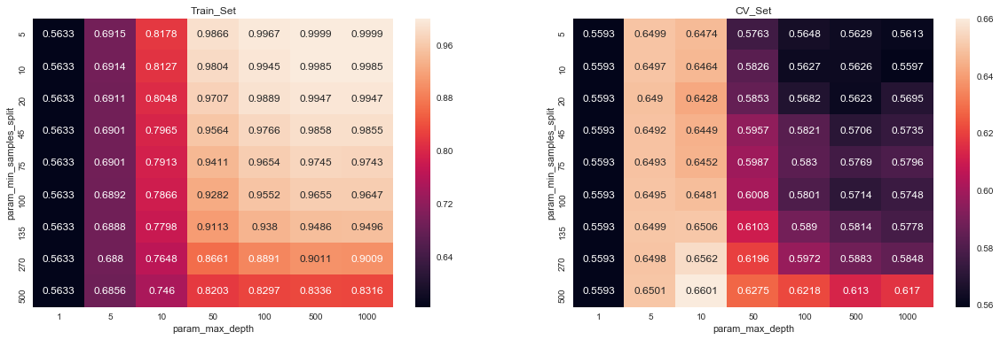

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7437476140823475
0.6630638223155174


In [81]:
max_depth,min_samples_split=find_Best_Kvalue(X_tra,X_cv,X_te,y_test,y_train,y_cv,'GridSearchCV')

### Traing the model for best max_depth and min_sample_split

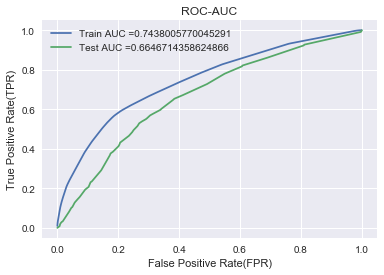

In [82]:
clf1,clfv, te_thresholds, test_tpr, test_fpr, y_test_pred, y_train_pred, tr_thresholds, train_fpr, train_tpr = BestModel(X_tra,X_cv,X_te,y_test,y_train,y_cv,max_depth,min_samples_split)

### Confusion Matrix on Train Set and Test Set

In [83]:
train_con,res_predictions_train = predict(y_train_pred,tr_thresholds,train_fpr,train_tpr)
test_con,res_predictions_test = predict(y_test_pred,tr_thresholds,test_fpr,test_tpr)
con_mat_train = confusion_matrix(y_train,train_con)
con_mat_test = confusion_matrix(y_test,test_con)

the maximum value of tpr*(1-fpr) 0.4702352941140676 for threshold 0.412
the maximum value of tpr*(1-fpr) 0.4020834475660742 for threshold 0.451


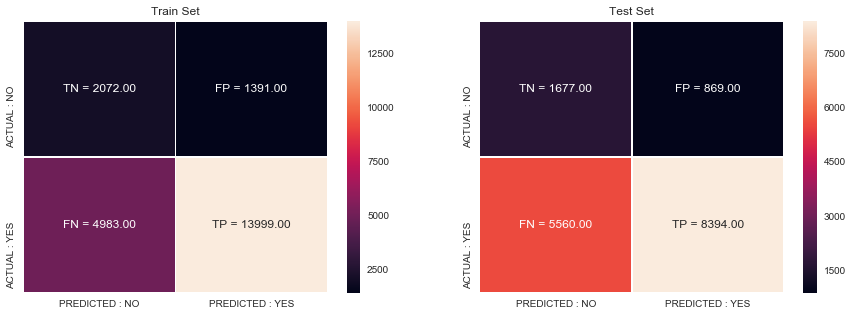

In [84]:
key = (np.asarray([['TN','FP'], ['FN', 'TP']]))
fig, ax = plt.subplots(1,2, figsize=(15,5))
labels_train = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(), con_mat_train.flatten())])).reshape(2,2)
labels_test = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(),con_mat_test.flatten())])).reshape(2,2)
sns.heatmap(con_mat_train, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'],yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_train, fmt = '', ax=ax[0])
sns.heatmap(con_mat_test, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'],yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_test, fmt = '', ax=ax[1])
ax[0].set_title('Train Set')
ax[1].set_title('Test Set')
plt.show()

### Visualizing Decision Tree

In [85]:
# Feature Aggregation
f1=ArNa_clean_categories
f2=ArNa_clean_subcategories
f3=ArNa_essay
f4=ArNa_project_title
f5=ArNa_school_state
fb=ArNa_teacher_prefix_categories
ft=ArNa_project_grade_category
fb1=ArNa_tfidf_essay
ft1=ArNa_tfidf_project_title

feature_agg_bow = f1 + f2 + f3 + f4 + f5 + fb + ft
feature_agg_tfidf = f1 + f2 + f3 + f4 + f5 + fb1 + ft1
# p is price, q is quantity, t is teacher previous year projects
feature_agg_bow.append('price')
feature_agg_tfidf.append('price')
feature_agg_bow.append('quantity')
feature_agg_tfidf.append('quantity')
feature_agg_bow.append('teacher_previous_projects')
feature_agg_tfidf.append('teacher_previous_projects')


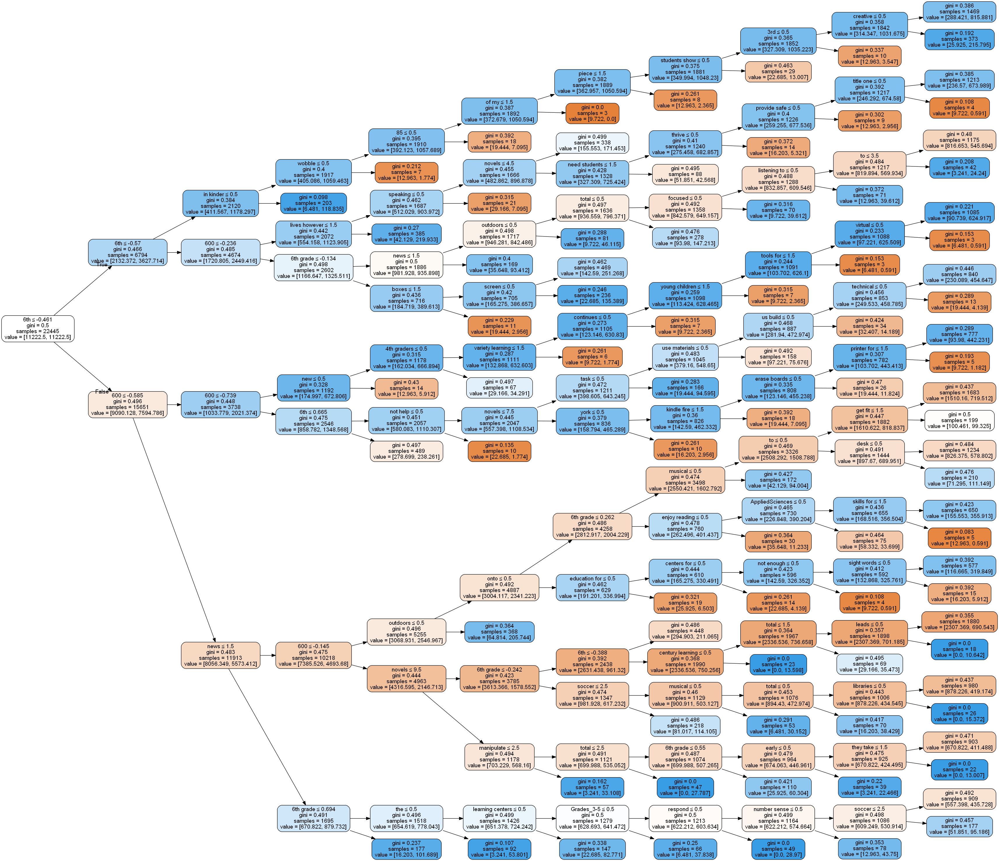

In [86]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.externals.six import StringIO
from IPython.display import Image
#fixing the executable for graphviz path
import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(clfv, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_bow,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())


### Analysis on the False positives

In [87]:
#Get the False positives datapoints
import random
X_test['clean_essays'].values[random.randrange(len(X_test))]

'our students come diverse backgrounds unique learning styles our goal reach engage individually adding technology classrooms help us reach learners these chrome books effectively utilized across curriculum members team we already seen difference laptops classroom make we want keep momentum going carry next school year beyond we use chrome books research projects family history project ela class they used connect classrooms across globe social studies class in math class students use receive personalized skill practice web sites khan academy students engage online experiments science class we see engaged students allowed use laptops class they task excited enthusiastic learning our students learning disabilities really benefit practice however students gain technology we teachers want'

In [88]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fpi = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 0) & (res_predictions_train[i] == 1) :
        fpi.append(i)
#print(fpi)
fp_essay = []
for i in fpi :
    fp_essay.append(X_test['clean_essays'].values[i])
    

### Word Cloud

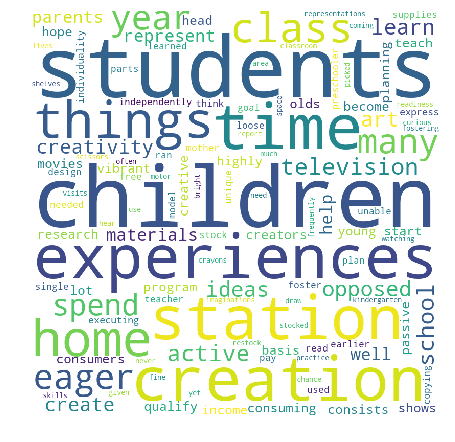

In [89]:
from wordcloud import WordCloud, STOPWORDS
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay:
    val = str(val)
    tokens = val.split()
    
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

### DataFrame of False Positives

In [90]:
# first get the columns:
cols = X_test.columns
X_test_falsePos = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos = X_test_falsePos.append(X_test.filter(items=[i], axis=0))

X_test_falsePos.head(1)
len(X_test_falsePos)

1754

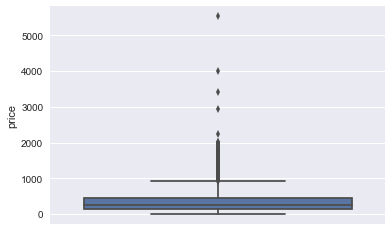

In [91]:
##Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos)

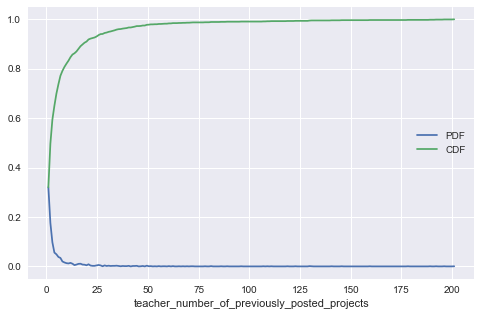

In [92]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
pdfP, = plt.plot(bin_edges[1:], pdf)
cdfP, = plt.plot(bin_edges[1:], cdf)
plt.legend([pdfP, cdfP], ["PDF", "CDF"])
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show()

### 2.4.2 Applying SVM on TFIDF,<font color='red'> SET 2</font>

In [93]:
#Sen_train = hstack((pos_standardized_train,neg_standardized_train, neu_standardized_train,com_standardized_train)).tocsr()
#Sen_test = hstack((pos_standardized_test,neg_standardized_test, neu_standardized_test,com_standardized_test)).tocsr()
#Sen_cv = hstack((pos_standardized_cv,neg_standardized_cv, neu_standardized_cv,com_standardized_cv)).tocsr()

X_tra = hstack((Data_train,title_tfidf_train,text_tfidf_train)).tocsr()
X_te = hstack((Data_test,title_tfidf_test,text_tfidf_test)).tocsr()
X_cv = hstack((Data_cv,title_tfidf_cv,text_tfidf_cv)).tocsr()

In [94]:
print("Final Shape of the Data matrix")
print(X_tra.shape, y_train.shape)
print(X_te.shape, y_test.shape)
print(X_cv.shape, y_cv.shape)

Final Shape of the Data matrix
(22445, 7442) (22445,)
(16500, 7442) (16500,)
(11055, 7442) (11055,)


### DT using GridsearchCV 

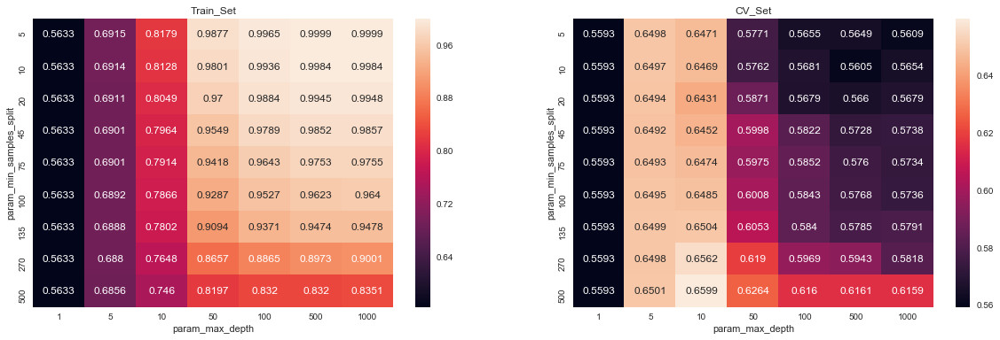

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7437476140823475
0.6656400262967053


In [95]:
max_depth,min_samples_split=find_Best_Kvalue(X_tra,X_cv,X_te,y_test,y_train,y_cv,'GridSearchCV')

### Traing the model for best max_depth and min_sample_split

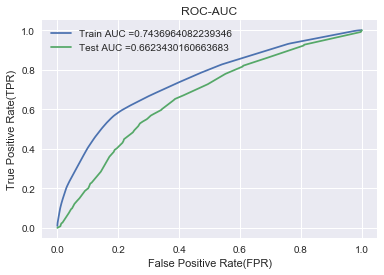

In [96]:
clf2,clfv, te_thresholds, test_tpr, test_fpr, y_test_pred, y_train_pred, tr_thresholds, train_fpr, train_tpr = BestModel(X_tra,X_cv,X_te,y_test,y_train,y_cv,max_depth,min_samples_split)

### Confusion Matrix on Train Set and Test Set

In [97]:
train_con,res_predictions_train = predict(y_train_pred,tr_thresholds,train_fpr,train_tpr)
test_con,res_predictions_test = predict(y_test_pred,tr_thresholds,test_fpr,test_tpr)
con_mat_train = confusion_matrix(y_train,train_con)
con_mat_test = confusion_matrix(y_test,test_con)

the maximum value of tpr*(1-fpr) 0.4707333570387351 for threshold 0.412
the maximum value of tpr*(1-fpr) 0.4000166184008707 for threshold 0.451


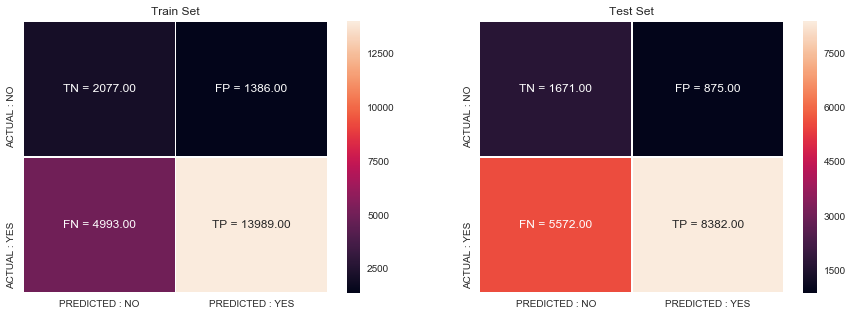

In [98]:
key = (np.asarray([['TN','FP'], ['FN', 'TP']]))
fig, ax = plt.subplots(1,2, figsize=(15,5))
labels_train = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(), con_mat_train.flatten())])).reshape(2,2)
labels_test = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(),con_mat_test.flatten())])).reshape(2,2)
sns.heatmap(con_mat_train, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'],yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_train, fmt = '', ax=ax[0])
sns.heatmap(con_mat_test, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'],yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_test, fmt = '', ax=ax[1])
ax[0].set_title('Train Set')
ax[1].set_title('Test Set')
plt.show()

### Visualizing Decision Tree

In [99]:
# Feature Aggregation
f1=ArNa_clean_categories
f2=ArNa_clean_subcategories
f3=ArNa_essay
f4=ArNa_project_title
f5=ArNa_school_state
fb=ArNa_teacher_prefix_categories
ft=ArNa_project_grade_category
fb1=ArNa_tfidf_essay
ft1=ArNa_tfidf_project_title

feature_agg_bow = f1 + f2 + f3 + f4 + f5 + fb + ft
feature_agg_tfidf = f1 + f2 + f3 + f4 + f5 + fb1 + ft1
# p is price, q is quantity, t is teacher previous year projects
feature_agg_bow.append('price')
feature_agg_tfidf.append('price')
feature_agg_bow.append('quantity')
feature_agg_tfidf.append('quantity')
feature_agg_bow.append('teacher_previous_projects')
feature_agg_tfidf.append('teacher_previous_projects')


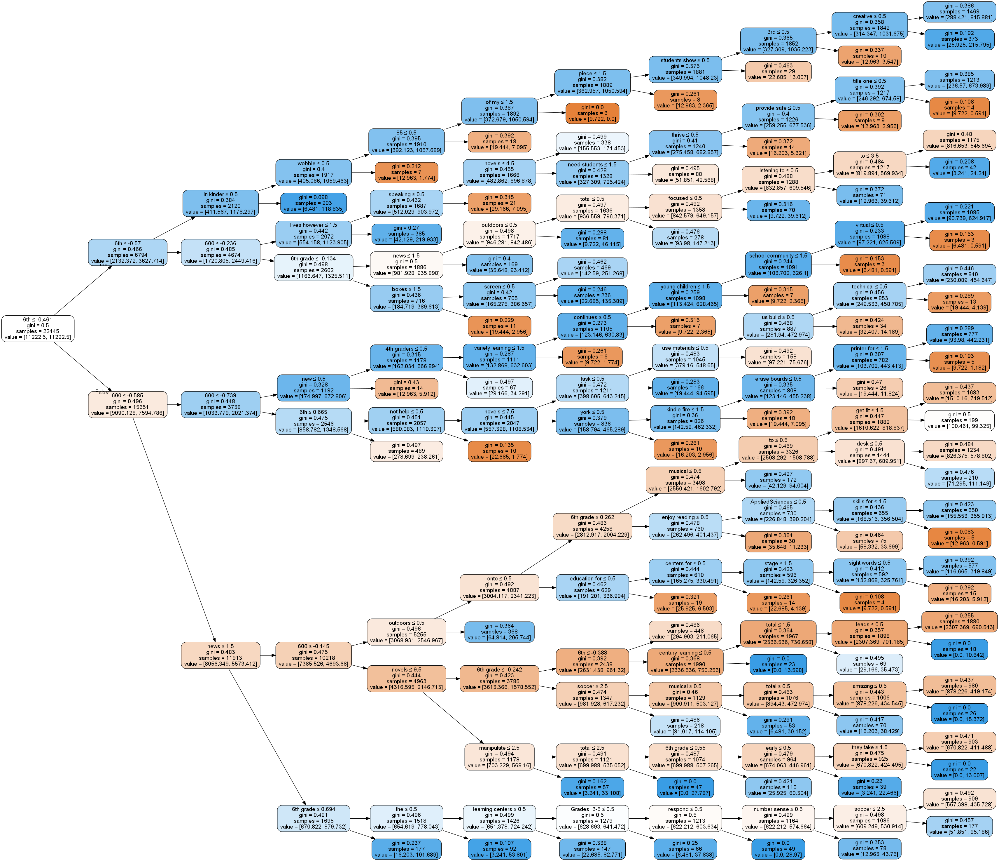

In [100]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.externals.six import StringIO
from IPython.display import Image
#fixing the executable for graphviz path
import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(clfv, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_bow,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())




### Analysis on the False positives

In [101]:
#Get the False positives datapoints
X_test['clean_essays'].values[random.randrange(len(X_test))]

'california facing unprecedented budget cuts especially education my ap students hope pass ap test may earning college credit still high school this help college many students trouble enrolling classes finishing four years many students parents not complete high school even middle school our students face many challenges including gangs violence poverty i amazed students perseverance resilience i want prepare many college i see successful my ap students dedicated hard working enthusiastic motivated students these students college bound really want well exam they know college expensive want minimize costs way one reason working hard class many older siblings tell community colleges students teach many students struggle enroll even one class the college credit earn high school easier get that i requesting ap study guides ap exam flash cards these study materials help students develop crucial study skills need pass exam they also able take skills college the books also valuable practice t

In [102]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fpi = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 0) & (res_predictions_train[i] == 1) :
        fpi.append(i)
#print(fpi)
fp_essay = []
for i in fpi :
    fp_essay.append(X_test['clean_essays'].values[i])
    

### Word Cloud

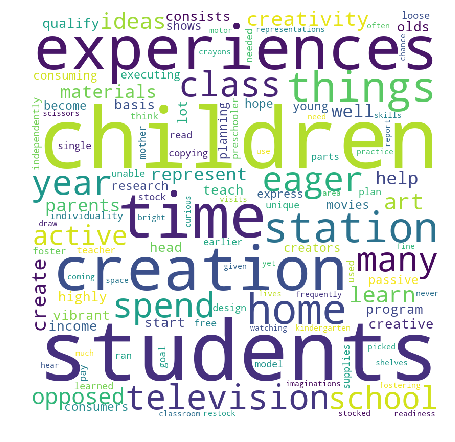

In [103]:
from wordcloud import WordCloud, STOPWORDS
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay:
    val = str(val)
    tokens = val.split()
    
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

### DataFrame of False Positives

In [104]:
# first get the columns:
cols = X_test.columns
X_test_falsePos = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos = X_test_falsePos.append(X_test.filter(items=[i], axis=0))

X_test_falsePos.head(1)
len(X_test_falsePos)

1753

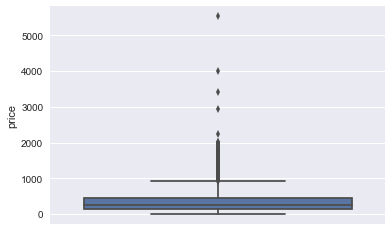

In [105]:
##Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos)

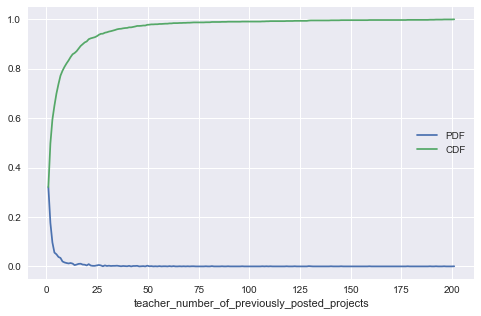

In [106]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
pdfP, = plt.plot(bin_edges[1:], pdf)
cdfP, = plt.plot(bin_edges[1:], cdf)
plt.legend([pdfP, cdfP], ["PDF", "CDF"])
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show()

<h2>Task Decision Tree on 5000 Important Features of set 1 </h2>

In [107]:
X_tra = hstack((Data_train,title_bow_train,text_bow_train)).tocsr()
X_te = hstack((Data_test,title_bow_test,text_bow_test)).tocsr()
X_cv = hstack((Data_cv,title_bow_cv,text_bow_cv)).tocsr()

In [108]:
print("Final Shape of the Data matrix")
print(X_tra.shape, y_train.shape)
print(X_te.shape, y_test.shape)
print(X_cv.shape, y_cv.shape)

Final Shape of the Data matrix
(22445, 7442) (22445,)
(16500, 7442) (16500,)
(11055, 7442) (11055,)


In [109]:
#https://stackoverflow.com/questions/47111434/randomforestregressor-and-feature-importances-error

def selectKImportance(model, X, k=5):
    return X[:,model.best_estimator_.feature_importances_.argsort()[::-1][:k]]

In [110]:
## set1 best features
X_best_train = selectKImportance(clf1, X_tra,5000)
X_best_test = selectKImportance(clf1, X_te, 5000)

print(X_best_train.shape)
print(X_best_test.shape)

(22445, 5000)
(16500, 5000)


### DT using GridsearchCV 

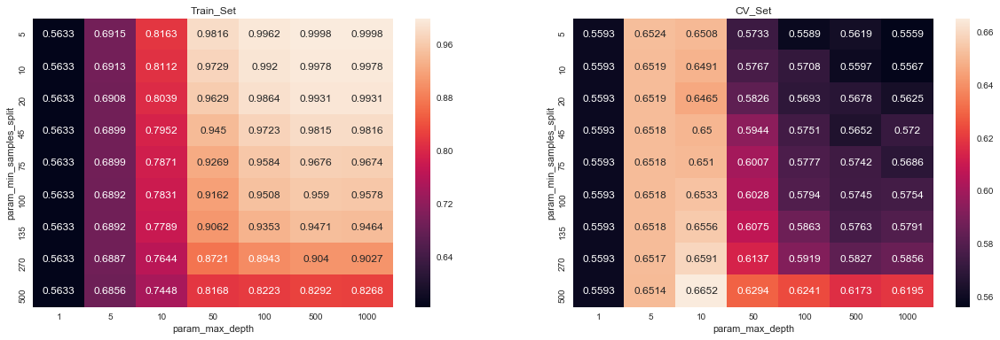

DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=10, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=500,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
0.7437495460918597
0.6653959857554633


In [111]:
max_depth,min_samples_split=find_Best_Kvalue(X_best_train,X_cv,X_best_test,y_test,y_train,y_cv,'GridSearchCV')

### Traing the model for best max_depth and min_sample_split

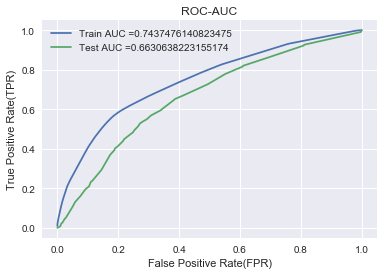

In [112]:
clf_best,clfv, te_thresholds, test_tpr, test_fpr, y_test_pred, y_train_pred, tr_thresholds, train_fpr, train_tpr = BestModel(X_tra,X_cv,X_te,y_test,y_train,y_cv,max_depth,min_samples_split)

### Confusion Matrix on Train Set and Test Set

In [113]:
train_con,res_predictions_train = predict(y_train_pred,tr_thresholds,train_fpr,train_tpr)
test_con,res_predictions_test = predict(y_test_pred,tr_thresholds,test_fpr,test_tpr)
con_mat_train = confusion_matrix(y_train,train_con)
con_mat_test = confusion_matrix(y_test,test_con)

the maximum value of tpr*(1-fpr) 0.471052047332225 for threshold 0.412
the maximum value of tpr*(1-fpr) 0.3999287412878652 for threshold 0.451


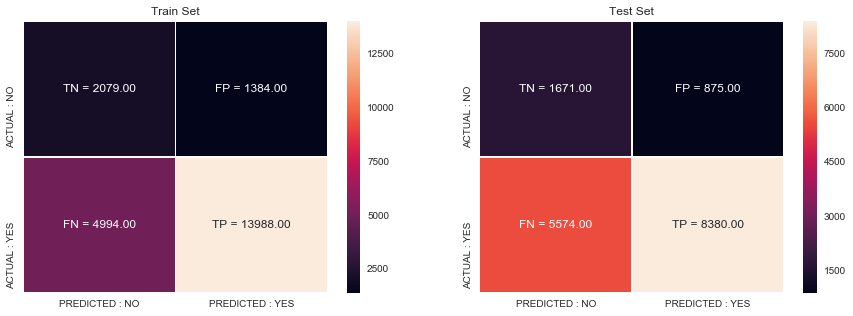

In [114]:
key = (np.asarray([['TN','FP'], ['FN', 'TP']]))
fig, ax = plt.subplots(1,2, figsize=(15,5))
labels_train = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(), con_mat_train.flatten())])).reshape(2,2)
labels_test = (np.asarray(["{0} = {1:.2f}" .format(key, value) for key, value in zip(key.flatten(),con_mat_test.flatten())])).reshape(2,2)
sns.heatmap(con_mat_train, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'],yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_train, fmt = '', ax=ax[0])
sns.heatmap(con_mat_test, linewidths=.5, xticklabels=['PREDICTED : NO', 'PREDICTED : YES'],yticklabels=['ACTUAL : NO', 'ACTUAL : YES'], annot = labels_test, fmt = '', ax=ax[1])
ax[0].set_title('Train Set')
ax[1].set_title('Test Set')
plt.show()

### Visualizing Decision Tree

In [115]:
# Feature Aggregation
f1=ArNa_clean_categories
f2=ArNa_clean_subcategories
f3=ArNa_essay
f4=ArNa_project_title
f5=ArNa_school_state
fb=ArNa_teacher_prefix_categories
ft=ArNa_project_grade_category
fb1=ArNa_tfidf_essay
ft1=ArNa_tfidf_project_title

feature_agg_bow = f1 + f2 + f3 + f4 + f5 + fb + ft
feature_agg_tfidf = f1 + f2 + f3 + f4 + f5 + fb1 + ft1
# p is price, q is quantity, t is teacher previous year projects
feature_agg_bow.append('price')
feature_agg_tfidf.append('price')
feature_agg_bow.append('quantity')
feature_agg_tfidf.append('quantity')
feature_agg_bow.append('teacher_previous_projects')
feature_agg_tfidf.append('teacher_previous_projects')


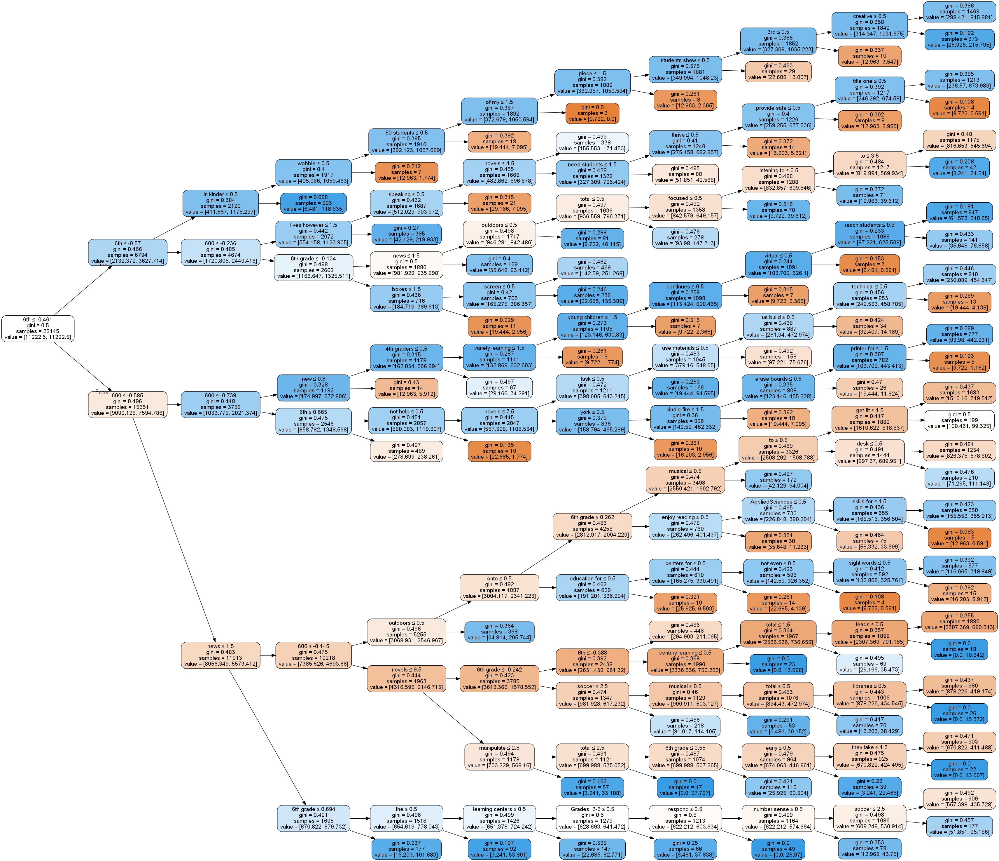

In [116]:
import warnings
warnings.filterwarnings("ignore")
from sklearn.externals.six import StringIO
from IPython.display import Image
#fixing the executable for graphviz path
import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(clfv, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=feature_agg_bow,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())




### Analysis on the False positives

In [117]:
#Get the False positives datapoints
X_test['clean_essays'].values[random.randrange(len(X_test))]

'the students rainier elementary dynamic unique attachment community these kids truly jewel south sound area the rainier community supports students immensely also struggles socioeconomically students hard working resilient struggle simple learning tasks various reasons most students lacking appropriate resources become successful continually work various needs get job done rainier elementary students vastly improved course last years still seeking ways reach students differentiated instruction as staff discovering new innovative ways reach kids thus influx new learning styles diversity children wobbly chairs helps differentiate environments we tried exercise balls traditional chairs wobbly seats discover wobbly seats allow kids kids learning high levels due nature learning discover students often lean back traditional chairs breaking limiting learning safety wobbly seats helps students continue fidget learn movement due growing budget needs lack resources i seeking facilitate purchase

In [118]:
#https://www.google.com/search?q=geeks+for+geeks+false+positive&rlz=1C1SQJL_enIN849IN849&oq=geeks+for+geeks+false+positive&aqs=chrome..69i57j33l5.6431j0j7&sourceid=chrome&ie=UTF-8
#https://github.com/pskadasi/DecisionTrees_DonorsChoose/blob/master/Copy_of_8_DonorsChoose_DT_(1).ipynb
fpi = []
for i in range(len(y_test)) :
    if (y_test.values[i] == 0) & (res_predictions_train[i] == 1) :
        fpi.append(i)
#print(fpi)
fp_essay = []
for i in fpi :
    fp_essay.append(X_test['clean_essays'].values[i])
    

### Word Cloud

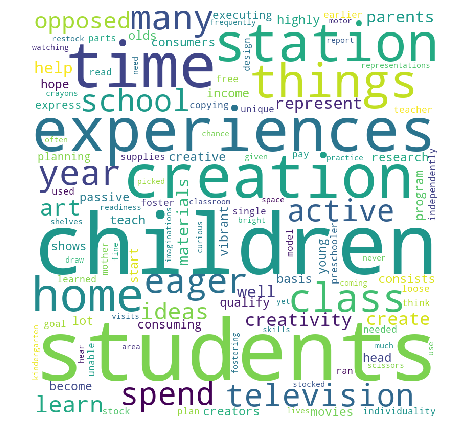

In [119]:
from wordcloud import WordCloud, STOPWORDS
comment_words = ' '
stopwords = set(STOPWORDS)
for val in fp_essay:
    val = str(val)
    tokens = val.split()
    
for i in range(len(tokens)):
    tokens[i] = tokens[i].lower()
for words in tokens :
    comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 800, background_color ='white', stopwords = stopwords,min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

### DataFrame of False Positives

In [120]:
# first get the columns:
cols = X_test.columns
X_test_falsePos = pd.DataFrame(columns=cols)

# get the data of the false pisitives
for i in fpi : # (in fpi all the false positives data points indexes)
    X_test_falsePos = X_test_falsePos.append(X_test.filter(items=[i], axis=0))

X_test_falsePos.head(1)
len(X_test_falsePos)

1753

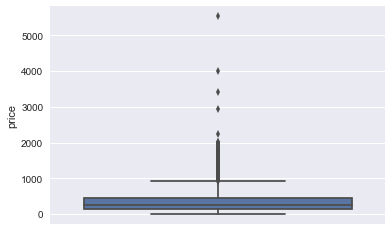

In [121]:
##Box Plot (FP 'price')
sns.boxplot(y='price', data=X_test_falsePos)

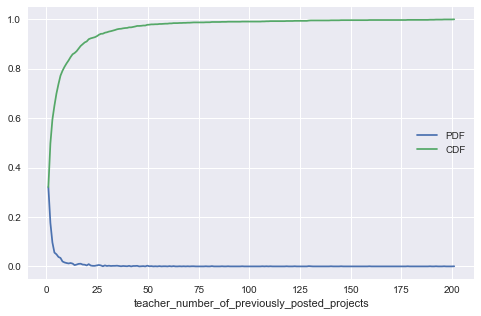

In [122]:
##PDF (FP ,teacher_number_of_previously_posted_projects)
plt.figure(figsize=(8,5))
counts, bin_edges = np.histogram(X_test_falsePos['teacher_number_of_previously_posted_projects'],
bins='auto', density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
pdfP, = plt.plot(bin_edges[1:], pdf)
cdfP, = plt.plot(bin_edges[1:], cdf)
plt.legend([pdfP, cdfP], ["PDF", "CDF"])
plt.xlabel('teacher_number_of_previously_posted_projects')
plt.show()

<h1>3. Conclusions</h1>

In [124]:
# Please compare all your models using Prettytable library

# http://zetcode.com/python/prettytable/

from prettytable import PrettyTable

x = PrettyTable()
x.field_names = ["Vectorizer Used", "Model","max_depth","min_samples_split", "AUC-Score"]

x.add_row(["BOW",                    "DT",10, 500, 0.67])
x.add_row(["TFIDF",                  "DT",10, 500, 0.66])
x.add_row(["Best 5000 Features BOW", "DT",10, 500, 0.66])


print(x)

+------------------------+-------+-----------+-------------------+-----------+
|    Vectorizer Used     | Model | max_depth | min_samples_split | AUC-Score |
+------------------------+-------+-----------+-------------------+-----------+
|          BOW           |   DT  |     10    |        500        |    0.67   |
|         TFIDF          |   DT  |     10    |        500        |    0.66   |
| Best 5000 Features BOW |   DT  |     10    |        500        |    0.66   |
+------------------------+-------+-----------+-------------------+-----------+
